# Logistic Regression

              precision    recall  f1-score   support

         0.0       0.05      0.68      0.09       742
         1.0       0.96      0.37      0.54     15893

    accuracy                           0.39     16635
   macro avg       0.50      0.53      0.31     16635
weighted avg       0.92      0.39      0.52     16635

Accuracy: 0.38707544334235044
Logistic Regression MSE: 0.24729571289388624


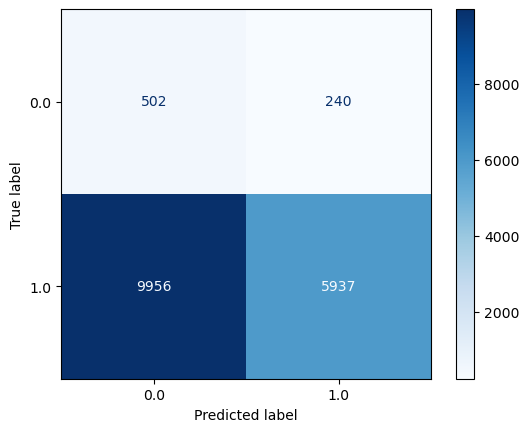

In [2]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, accuracy_score
from sklearn.metrics import ConfusionMatrixDisplay, mean_squared_error


# Load and preprocess the dataset
data = pd.read_csv("Traffic_Crashes.csv")
data['HIT_AND_RUN_I'] = data['HIT_AND_RUN_I'].map({'Y': 1, 'N': 0})
features = ['CRASH_HOUR', 'CRASH_DAY_OF_WEEK', 'LIGHTING_CONDITION', 'LANE_CNT', 'ROADWAY_SURFACE_COND', 'POSTED_SPEED_LIMIT']
data = data[features + ['HIT_AND_RUN_I']].dropna()

# Encode categorical features
data = pd.get_dummies(data, columns=['LIGHTING_CONDITION', 'ROADWAY_SURFACE_COND'], drop_first=True)

# Split data
X = data.drop('HIT_AND_RUN_I', axis=1)
y = data['HIT_AND_RUN_I']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Train logistic regression
log_reg = LogisticRegression(max_iter=1000, class_weight='balanced')
log_reg.fit(X_train, y_train)

# Evaluate
y_pred = log_reg.predict(X_test)
print(classification_report(y_test, y_pred))
print("Accuracy:", accuracy_score(y_test, y_pred))
ConfusionMatrixDisplay.from_estimator(log_reg, X_test, y_test, cmap='Blues')

y_prob_log_reg = log_reg.predict_proba(X_test)[:, 1]  # Probability of class 1

# Calculate MSE
mse_log_reg = mean_squared_error(y_test, y_prob_log_reg)
print("Logistic Regression MSE:", mse_log_reg)

In [3]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_val_score

# L1 Regularization (Lasso)
log_reg_l1 = LogisticRegression(penalty='l1', solver='liblinear', max_iter=1000)
l1_scores = cross_val_score(log_reg_l1, X, y, cv=5, scoring='accuracy')
print("L1 Regularization Cross-Validation Accuracy:", l1_scores.mean())

# L2 Regularization (Ridge)
log_reg_l2 = LogisticRegression(penalty='l2', solver='liblinear', max_iter=1000)
l2_scores = cross_val_score(log_reg_l2, X, y, cv=5, scoring='accuracy')
print("L2 Regularization Cross-Validation Accuracy:", l2_scores.mean())

L1 Regularization Cross-Validation Accuracy: 0.9554733994589719
L2 Regularization Cross-Validation Accuracy: 0.9554733994589719


In [4]:
# Train and evaluate Logistic Regression with L1 Regularization (Lasso)
log_reg_l1.fit(X_train, y_train)
y_pred_l1 = log_reg_l1.predict(X_test)
test_accuracy_l1 = accuracy_score(y_test, y_pred_l1)
print("L1 Regularization Test Accuracy:", test_accuracy_l1)

# Train and evaluate Logistic Regression with L2 Regularization (Ridge)
log_reg_l2.fit(X_train, y_train)
y_pred_l2 = log_reg_l2.predict(X_test)
test_accuracy_l2 = accuracy_score(y_test, y_pred_l2)
print("L2 Regularization Test Accuracy:", test_accuracy_l2)


/opt/anaconda3/lib/python3.12/site-packages/sklearn/svm/_base.py:1237: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


L1 Regularization Test Accuracy: 0.9553952509768561
L2 Regularization Test Accuracy: 0.9553952509768561


# Decision Trees

              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00       742
         1.0       0.96      1.00      0.98     15893

    accuracy                           0.96     16635
   macro avg       0.48      0.50      0.49     16635
weighted avg       0.91      0.96      0.93     16635



/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


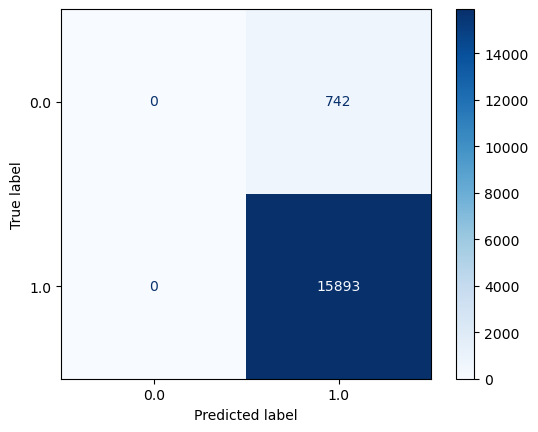

In [8]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# Train decision tree
tree = DecisionTreeClassifier(max_depth=5, random_state=42)
tree.fit(X_train, y_train)

# Evaluate
y_pred_tree = tree.predict(X_test)
print(classification_report(y_test, y_pred_tree))

# Generate and plot confusion matrix
cm = confusion_matrix(y_test, y_pred_tree)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=tree.classes_)
disp.plot(cmap='Blues')

In [21]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import cross_val_score

# Pruned decision tree
tree_pruned = DecisionTreeClassifier(max_depth=5, min_samples_split=10, min_samples_leaf=5, random_state=42)
tree_scores = cross_val_score(tree_pruned, X, y, cv=5, scoring='accuracy')
print("Pruned Decision Tree Cross-Validation Accuracy:", tree_scores.mean())


Pruned Decision Tree Cross-Validation Accuracy: 0.9554914337240756


# Random Forests

In [18]:
from sklearn.ensemble import RandomForestClassifier

# Train random forest
rf = RandomForestClassifier(n_estimators=100, random_state=42, class_weight='balanced')
rf.fit(X_train, y_train)

# Evaluate
y_pred_rf = rf.predict(X_test)
print(classification_report(y_test, y_pred_rf))


              precision    recall  f1-score   support

         0.0       0.05      0.21      0.08       742
         1.0       0.96      0.82      0.89     15893

    accuracy                           0.80     16635
   macro avg       0.50      0.51      0.48     16635
weighted avg       0.92      0.80      0.85     16635



In [22]:
from sklearn.ensemble import RandomForestClassifier

# Random forest with cross-validation
rf = RandomForestClassifier(random_state=42)
rf_scores = cross_val_score(rf, X, y, cv=5, scoring='accuracy')
print("Random Forest Cross-Validation Accuracy:", rf_scores.mean())


Random Forest Cross-Validation Accuracy: 0.9503877366997294


# Neural Networks

In [15]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.optimizers import Adam
from sklearn.preprocessing import StandardScaler

# Scale features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Build neural network
model = Sequential([
    Dense(32, activation='relu', input_dim=X_train_scaled.shape[1]),
    Dense(16, activation='relu'),
    Dense(1, activation='sigmoid')
])
model.compile(optimizer=Adam(learning_rate=0.001), loss='binary_crossentropy', metrics=['accuracy'])

# Train
model.fit(X_train_scaled, y_train, epochs=20, batch_size=32, validation_split=0.2)

# Evaluate
loss, accuracy = model.evaluate(X_test_scaled, y_test)
print("Neural Network Accuracy:", accuracy)

Epoch 1/20


/opt/anaconda3/lib/python3.12/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


971/971 ━━━━━━━━━━━━━━━━━━━━ 1s 354us/step - accuracy: 0.9503 - loss: 0.2285 - val_accuracy: 0.9552 - val_loss: 0.1838
Epoch 2/20
971/971 ━━━━━━━━━━━━━━━━━━━━ 0s 286us/step - accuracy: 0.9571 - loss: 0.1783 - val_accuracy: 0.9552 - val_loss: 0.1838
Epoch 3/20
971/971 ━━━━━━━━━━━━━━━━━━━━ 0s 291us/step - accuracy: 0.9563 - loss: 0.1792 - val_accuracy: 0.9552 - val_loss: 0.1849
Epoch 4/20
971/971 ━━━━━━━━━━━━━━━━━━━━ 0s 273us/step - accuracy: 0.9547 - loss: 0.1837 - val_accuracy: 0.9552 - val_loss: 0.1846
Epoch 5/20
971/971 ━━━━━━━━━━━━━━━━━━━━ 0s 308us/step - accuracy: 0.9568 - loss: 0.1768 - val_accuracy: 0.9552 - val_loss: 0.1840
Epoch 6/20
971/971 ━━━━━━━━━━━━━━━━━━━━ 0s 273us/step - accuracy: 0.9549 - loss: 0.1827 - val_accuracy: 0.9552 - val_loss: 0.1829
Epoch 7/20
971/971 ━━━━━━━━━━━━━━━━━━━━ 0s 275us/step - accuracy: 0.9557 - loss: 0.1803 - val_accuracy: 0.9552 - val_loss: 0.1853
Epoch 8/20
971/971 ━━━━━━━━━━━━━━━━━━━━ 0s 269us/step - accuracy: 0.9562 - loss: 0.1790 - val_accurac

In [20]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.regularizers import l2
from tensorflow.keras.optimizers import Adam

# Neural network with L2 regularization
model = Sequential([
    Dense(32, activation='relu', input_dim=X_train_scaled.shape[1], kernel_regularizer=l2(0.01)),
    Dense(16, activation='relu', kernel_regularizer=l2(0.01)),
    Dense(1, activation='sigmoid')
])
model.compile(optimizer=Adam(learning_rate=0.001), loss='binary_crossentropy', metrics=['accuracy'])

# Train
model.fit(X_train_scaled, y_train, epochs=20, batch_size=32, validation_split=0.2)

# Evaluate
loss, accuracy = model.evaluate(X_test_scaled, y_test)
print("Neural Network with L2 Regularization Accuracy:", accuracy)


Epoch 1/20


/opt/anaconda3/lib/python3.12/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


971/971 ━━━━━━━━━━━━━━━━━━━━ 1s 331us/step - accuracy: 0.9381 - loss: 0.4518 - val_accuracy: 0.9552 - val_loss: 0.2004
Epoch 2/20
971/971 ━━━━━━━━━━━━━━━━━━━━ 0s 277us/step - accuracy: 0.9553 - loss: 0.1941 - val_accuracy: 0.9552 - val_loss: 0.1856
Epoch 3/20
971/971 ━━━━━━━━━━━━━━━━━━━━ 0s 277us/step - accuracy: 0.9571 - loss: 0.1790 - val_accuracy: 0.9552 - val_loss: 0.1842
Epoch 4/20
971/971 ━━━━━━━━━━━━━━━━━━━━ 0s 274us/step - accuracy: 0.9551 - loss: 0.1845 - val_accuracy: 0.9552 - val_loss: 0.1834
Epoch 5/20
971/971 ━━━━━━━━━━━━━━━━━━━━ 0s 302us/step - accuracy: 0.9559 - loss: 0.1815 - val_accuracy: 0.9552 - val_loss: 0.1835
Epoch 6/20
971/971 ━━━━━━━━━━━━━━━━━━━━ 0s 277us/step - accuracy: 0.9552 - loss: 0.1834 - val_accuracy: 0.9552 - val_loss: 0.1832
Epoch 7/20
971/971 ━━━━━━━━━━━━━━━━━━━━ 0s 273us/step - accuracy: 0.9565 - loss: 0.1794 - val_accuracy: 0.9552 - val_loss: 0.1832
Epoch 8/20
971/971 ━━━━━━━━━━━━━━━━━━━━ 0s 273us/step - accuracy: 0.9548 - loss: 0.1850 - val_accurac

# Clustering

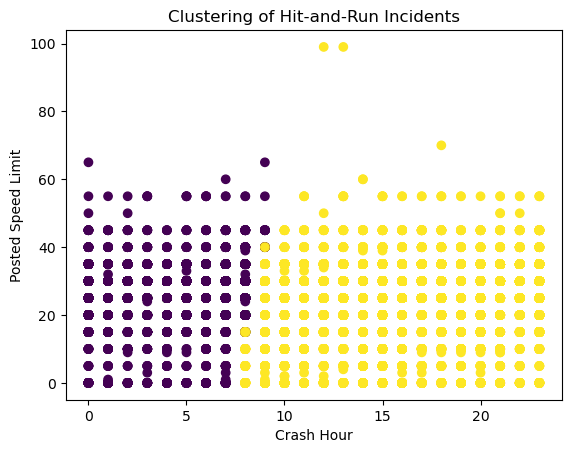

In [11]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# Use KMeans to cluster
kmeans = KMeans(n_clusters=3, random_state=42)
data['Cluster'] = kmeans.fit_predict(X)

# Visualize clusters
plt.scatter(X['CRASH_HOUR'], X['POSTED_SPEED_LIMIT'], c=data['Cluster'])
plt.xlabel('Crash Hour')
plt.ylabel('Posted Speed Limit')
plt.title('Clustering of Hit-and-Run Incidents')
plt.show()


In [27]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# Select latitude and longitude for clustering
data = pd.read_csv("Traffic_Crashes.csv")
spatial_data = data[['LATITUDE', 'LONGITUDE']].dropna()

# Cluster data into 5 clusters (example)
kmeans = KMeans(n_clusters=5, random_state=42)
spatial_data['Cluster'] = kmeans.fit_predict(spatial_data)

# Add cluster labels to the original dataset
data['Crash_Hotspot'] = kmeans.predict(data[['LATITUDE', 'LONGITUDE']])

# Visualize clusters
plt.scatter(spatial_data['LATITUDE'], spatial_data['LONGITUDE'], c=spatial_data['Cluster'], cmap='viridis', s=10)
plt.title('Crash Hotspots')
plt.xlabel('Latitude')
plt.ylabel('Longitude')
plt.show()


ValueError: Input X contains NaN.
KMeans does not accept missing values encoded as NaN natively. For supervised learning, you might want to consider sklearn.ensemble.HistGradientBoostingClassifier and Regressor which accept missing values encoded as NaNs natively. Alternatively, it is possible to preprocess the data, for instance by using an imputer transformer in a pipeline or drop samples with missing values. See https://scikit-learn.org/stable/modules/impute.html You can find a list of all estimators that handle NaN values at the following page: https://scikit-learn.org/stable/modules/impute.html#estimators-that-handle-nan-values

In [3]:
import pandas as pd
from sklearn.cluster import KMeans
import folium

# Load dataset
data = pd.read_csv("Traffic_Crashes.csv")

# Filter data for hit-and-run incidents
hit_and_run_data = data[data['HIT_AND_RUN_I'] == 'Y']

# Select latitude, longitude, and additional features for clustering
spatial_data = hit_and_run_data[['LATITUDE', 'LONGITUDE', 'CRASH_HOUR']].dropna()

# Standardize CRASH_HOUR to bring it to the same scale as LATITUDE/LONGITUDE
spatial_data['CRASH_HOUR'] = spatial_data['CRASH_HOUR'] / 24.0  # Scale between 0 and 1

# Perform clustering
kmeans = KMeans(n_clusters=5, random_state=42)
spatial_data['Cluster'] = kmeans.fit_predict(spatial_data[['LATITUDE', 'LONGITUDE', 'CRASH_HOUR']])

# Reduce dataset size for better visualization
spatial_sample = spatial_data.sample(frac=0.1, random_state=42).reset_index(drop=True)

# Create a base folium map centered around Chicago
m = folium.Map(location=[41.8781, -87.6298], zoom_start=11)

# Define cluster colors
colors = ['red', 'blue', 'green', 'purple', 'orange']

# Add clustered points to the map
for idx, row in spatial_sample.iterrows():
    folium.CircleMarker(
        location=[row['LATITUDE'], row['LONGITUDE']],
        radius=3,
        color=colors[int(row['Cluster'])],
        fill=True,
        fill_color=colors[int(row['Cluster'])],
        fill_opacity=0.7,
    ).add_to(m)

# Save the map to an HTML file or display it
m.save('hit_and_run_clusters.html')

# Display map (if in a Jupyter environment)
m


In [7]:
import pandas as pd
import folium

# Load dataset
data = pd.read_csv("Traffic_Crashes.csv")

# Filter data for hit-and-run incidents
hit_and_run_data = data[data['HIT_AND_RUN_I'] == 'Y']
hit_and_run_data = hit_and_run_data.sample(frac=0.1, random_state=42).reset_index(drop=True)


# Select relevant columns and drop missing values
hit_and_run_data = hit_and_run_data[['LATITUDE', 'LONGITUDE', 'POSTED_SPEED_LIMIT']].dropna()

# Define speed limit categories
def categorize_speed(speed):
    if speed <= 20:
        return 'Very Low'
    elif speed <= 35:
        return 'Low'
    elif speed <= 50:
        return 'Moderate'
    elif speed <= 65:
        return 'High'
    else:
        return 'Very High'

# Apply the categorization
hit_and_run_data['Speed_Category'] = hit_and_run_data['POSTED_SPEED_LIMIT'].apply(categorize_speed)

# Map speed categories to colors
speed_colors = {
    'Very Low': 'blue',
    'Low': 'green',
    'Moderate': 'orange',
    'High': 'red',
    'Very High': 'purple'
}

# Create a base folium map centered around Chicago
m = folium.Map(location=[41.8781, -87.6298], zoom_start=11)

# Add hit-and-run points color-coded by speed categories
for idx, row in hit_and_run_data.iterrows():
    category = row['Speed_Category']
    color = speed_colors[category]
    folium.CircleMarker(
        location=[row['LATITUDE'], row['LONGITUDE']],
        radius=3,
        color=color,
        fill=True,
        fill_color=color,
        fill_opacity=0.7,
        popup=f"Speed: {row['POSTED_SPEED_LIMIT']} mph, Category: {category}"
    ).add_to(m)

# Save the map to an HTML file or display it
m.save('hit_and_run_by_speed.html')

# Display map (if in a Jupyter environment)
m


KeyboardInterrupt: 